In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import math

In [ ]:
Image = cv2.imread('/content/aaa.jpg',1)

from skimage import data
from skimage.color import rgb2gray

#Image = data.astronaut()
#Image = rgb2gray(Image)

image = cv2.cvtColor(Image,cv2.COLOR_BGR2GRAY)
img=np.array(image,dtype=np.float64)

In [ ]:
IniLSF = np.ones((img.shape[0],img.shape[1]),img.dtype)
IniLSF[30:80,30:80]= -1
IniLSF=-IniLSF

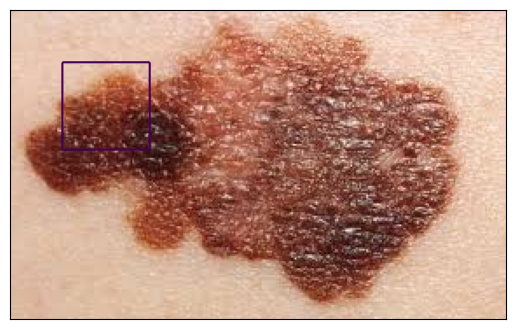

(None, None)

In [ ]:
Image = cv2.cvtColor(Image,cv2.COLOR_BGR2RGB)
plt.figure(1),plt.imshow(Image),plt.xticks([]), plt.yticks([])   # to hide tick values on X and Y axis
plt.contour(IniLSF,[0])
plt.draw(),plt.show(block=False)

<ipython-input-5-1c4e23c306b4>:50: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF,[0],colors='r',linewidth=2)


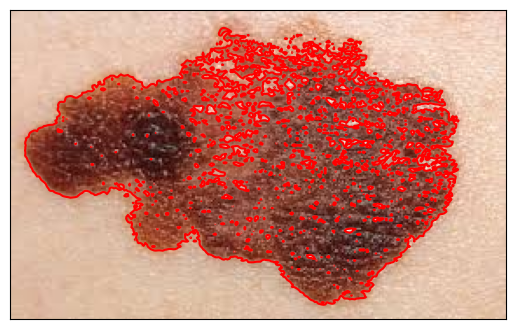

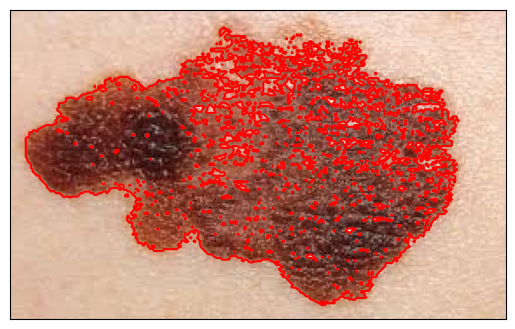

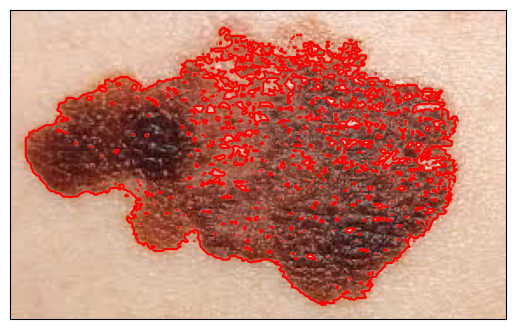

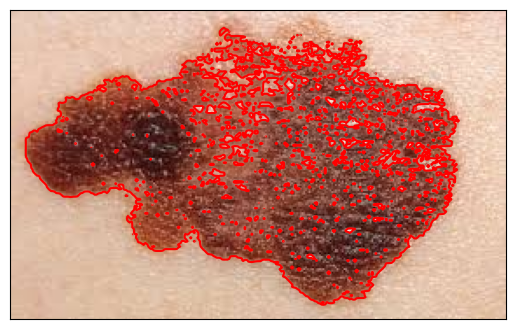

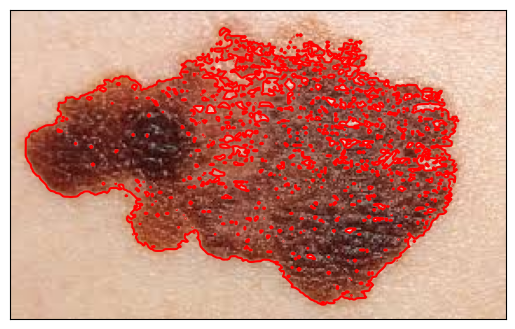

...

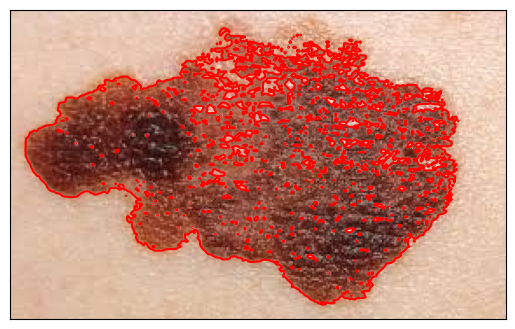

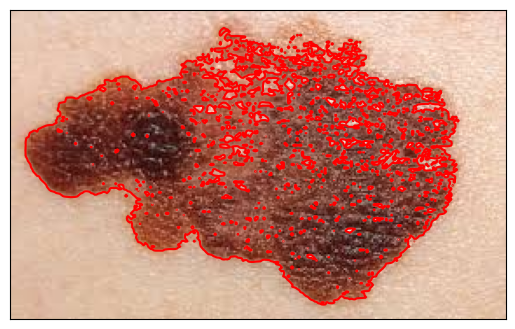

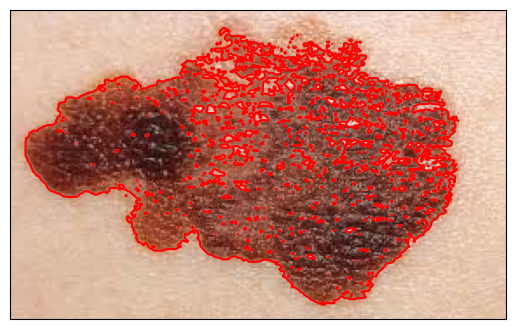

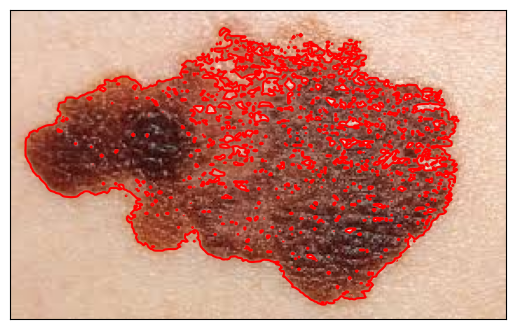

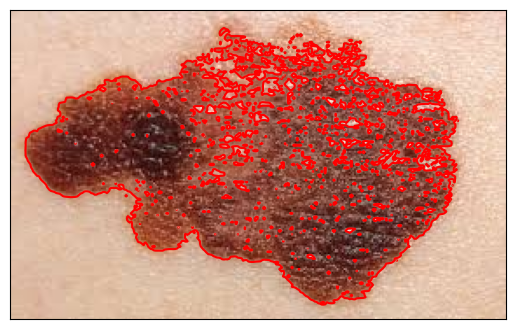

In [ ]:
def mat_math (intput,str):
    output=intput
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if str=="atan":
                output[i,j] = math.atan(intput[i,j])
            if str=="sqrt":
                output[i,j] = math.sqrt(intput[i,j])
    return output


def CV (LSF, img, mu, nu, epison,step):

    Drc = (epison / math.pi) / (epison*epison+ LSF*LSF)
    Hea = 0.5*(1 + (2 / math.pi)*mat_math(LSF/epison,"atan"))
    Iy, Ix = np.gradient(LSF)
    s = mat_math(Ix*Ix+Iy*Iy,"sqrt")
    Nx = Ix / (s+0.000001)
    Ny = Iy / (s+0.000001)
    Mxx,Nxx =np.gradient(Nx)
    Nyy,Myy =np.gradient(Ny)
    cur = Nxx + Nyy
    Length = nu*Drc*cur

    Lap = cv2.Laplacian(LSF,-1)
    Penalty = mu*(Lap - cur)

    s1=Hea*img
    s2=(1-Hea)*img
    s3=1-Hea
    C1 = s1.sum()/ Hea.sum()
    C2 = s2.sum()/ s3.sum()
    CVterm = Drc*(-1 * (img - C1)*(img - C1) + 1 * (img - C2)*(img - C2))

    LSF = LSF + step*(Length + Penalty + CVterm)
    #plt.imshow(s, cmap ='gray'),plt.show()
    return LSF


mu = 1
nu = 0.003 * 255 * 255
num = 20
epison = 1
step = 0.1
LSF=IniLSF
for i in range(1,num):
    LSF = CV(LSF, img, mu, nu, epison,step)
    if i % 1 == 0:
        plt.imshow(Image),plt.xticks([]), plt.yticks([])
        plt.contour(LSF,[0],colors='r',linewidth=2)
        plt.draw(),plt.show(block=False),plt.pause(0.01)

In [ ]:
image_filename = "my_plot.png"
plt.savefig(image_filename)


<Figure size 640x480 with 0 Axes>

<ipython-input-8-add907474ea4>:16: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='b', linewidth=2)


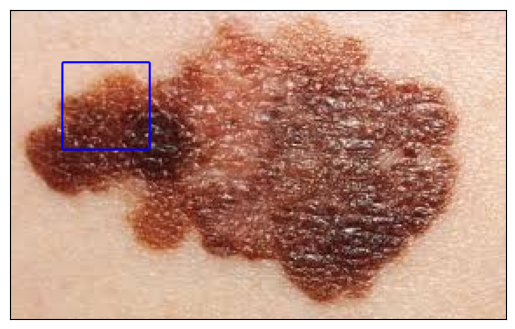

<ipython-input-8-add907474ea4>:71: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='r', linewidth=2)


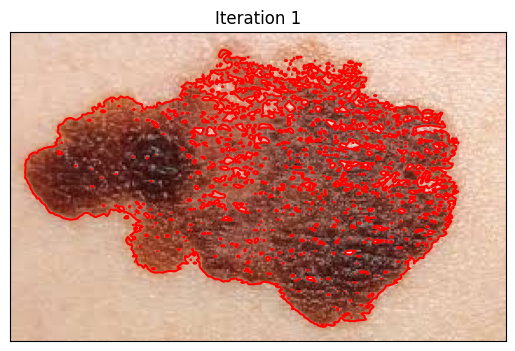

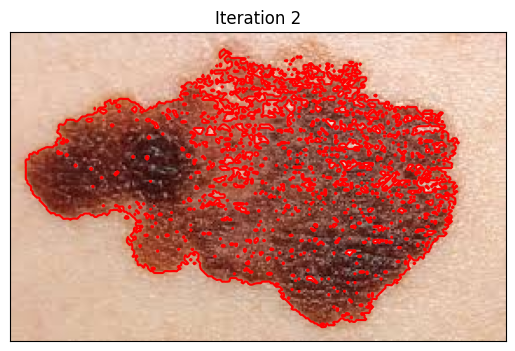

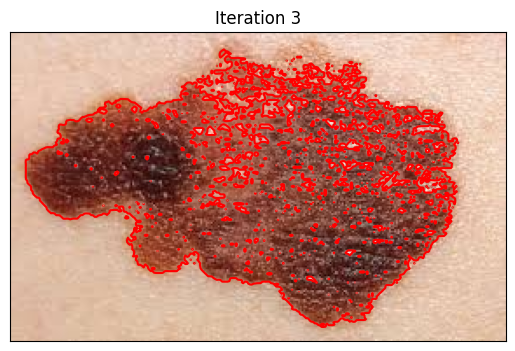

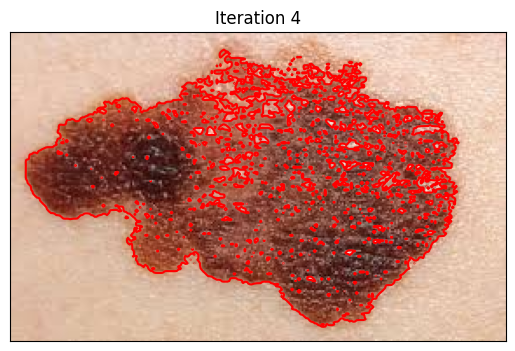

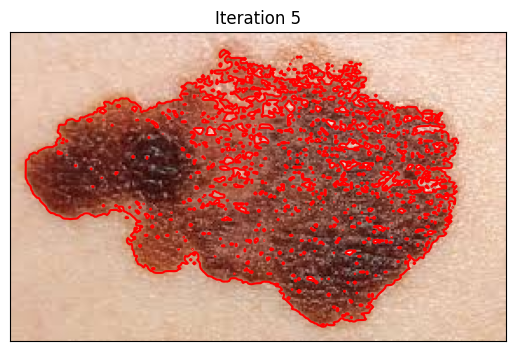

...

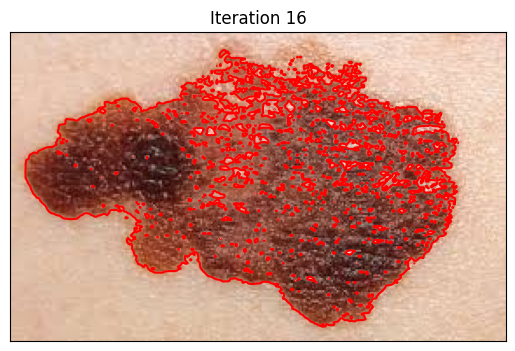

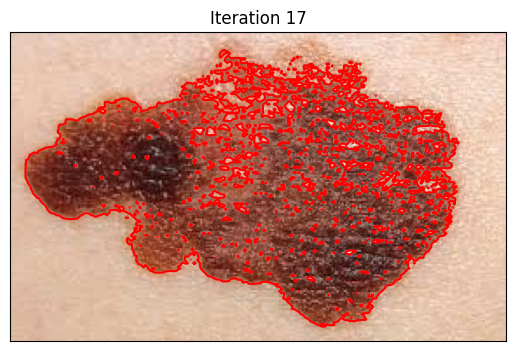

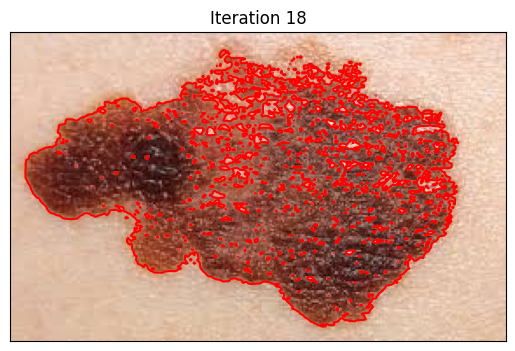

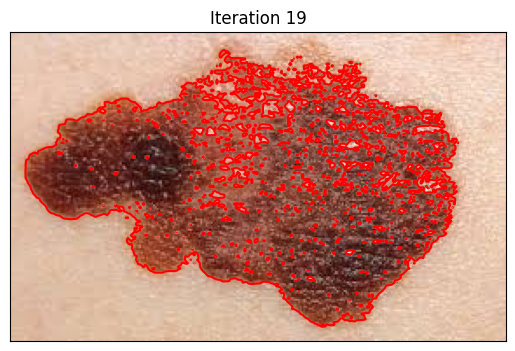

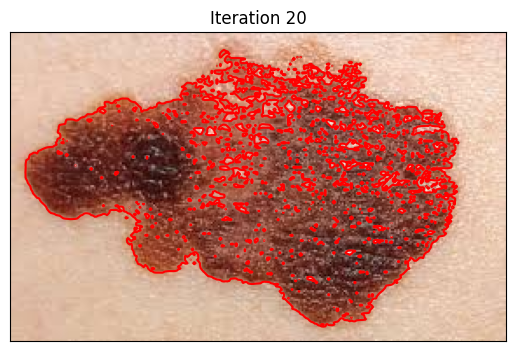

<ipython-input-8-add907474ea4>:89: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(evolved_LSF, [0], colors='r', linewidth=2)


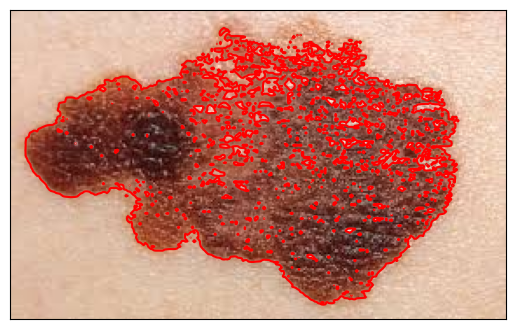

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Load and preprocess the image
image = cv2.imread(r"/content/aaa.jpg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
LSF = np.ones_like(gray_image, dtype=np.float64)
LSF[30:80, 30:80] = -1
LSF = -LSF

# Display the original image with initial contour
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(LSF, [0], colors='b', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

# Function to perform mathematical operations on matrices
def apply_math(input_matrix, operation):
    output = np.copy(input_matrix)
    for i in range(input_matrix.shape[0]):
        for j in range(input_matrix.shape[1]):
            if operation == "atan":
                output[i, j] = math.atan(input_matrix[i, j])
            elif operation == "sqrt":
                output[i, j] = math.sqrt(input_matrix[i, j])
    return output

# Function to compute the Laplacian manually
def manual_laplacian(input_matrix):
    output = np.zeros_like(input_matrix)
    for i in range(1, input_matrix.shape[0] - 1):
        for j in range(1, input_matrix.shape[1] - 1):
            output[i, j] = (input_matrix[i-1, j] + input_matrix[i+1, j] +
                           input_matrix[i, j-1] + input_matrix[i, j+1] -
                           4 * input_matrix[i, j])
    return output

# Function to perform the CV evolution
def evolve_cv(LSF, img, mu, nu, epsilon, step, num_iterations):
    for i in range(num_iterations):
        Drc = (epsilon / math.pi) / (epsilon * epsilon + LSF * LSF)
        Heaviside = 0.5 * (1 + (2 / math.pi) * apply_math(LSF / epsilon, "atan"))

        Iy, Ix = np.gradient(LSF)
        s = apply_math(Ix * Ix + Iy * Iy, "sqrt")
        Nx = Ix / (s + 0.000001)
        Ny = Iy / (s + 0.000001)
        Mxx, _ = np.gradient(Nx)
        Nyy, _ = np.gradient(Ny)
        curvature = Mxx + Nyy
        length_term = nu * Drc * curvature

        laplacian = manual_laplacian(LSF)
        penalty_term = mu * (laplacian - curvature)

        s1 = Heaviside * img
        s2 = (1 - Heaviside) * img
        s3 = 1 - Heaviside
        C1 = np.sum(s1) / np.sum(Heaviside)
        C2 = np.sum(s2) / np.sum(s3)
        CV_term = Drc * (-1 * (img - C1) * (img - C1) + 1 * (img - C2) * (img - C2))

        LSF = LSF + step * (length_term + penalty_term + CV_term)

        # Display the current iteration
        plt.figure()
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.contour(LSF, [0], colors='r', linewidth=2)
        plt.xticks([]), plt.yticks([])
        plt.title(f"Iteration {i+1}")
        plt.show()

    return LSF

# Parameters for CV evolution
mu = 1
nu = 0.003 * 255 * 255
epsilon = 1
step_size = 0.1
num_iterations = 20

# Perform CV evolution and display the results
evolved_LSF = evolve_cv(LSF, gray_image, mu, nu, epsilon, step_size, num_iterations)
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(evolved_LSF, [0], colors='r', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
import numpy as np

def jaccard_index(seg_result, ground_truth):
    ytrue

    intersection = np.sum(seg_result * ground_truth)
    union = np.sum(np.logical_or(seg_result, ground_truth))
    jaccard = intersection / union
    return jaccard

Image = cv2.imread('/content/cccc.jpg',1)
segmented_image = cv2.imread('/content/my_plot.png',1)
print(jaccard_index(Image,segmented_image))

NameError: name 'ytrue' is not defined

In [ ]:
img = noise(50+100*gaussf(rr>85,2),'gaussian',20)
x = 120+50*cos(0:0.1:2*pi)';
y = 140+60*sin(0:0.1:2*pi)';
hold on, plot([x;x(1)],[y;y(1)],'g')
alpha = 0.001;
beta = 0.4;
gamma = 100;
iterations = 50;
N = length(x);
a = gamma*(2*alpha+6*beta)+1;
b = gamma*(-alpha-4*beta);
c = gamma*beta;
P = diag(repmat(a,1,N));
P = P + diag(repmat(b,1,N-1), 1) + diag(   b, -N+1);
P = P + diag(repmat(b,1,N-1),-1) + diag(   b,  N-1);
P = P + diag(repmat(c,1,N-2), 2) + diag([c,c],-N+2);
P = P + diag(repmat(c,1,N-2),-2) + diag([c,c], N-2);
P = inv(P);
f = gradient(gradmag(img,30));
for ii = 1:iterations
   % Calculate external force
   coords = [x,y];
   fex = get_subpixel(f{1},coords,'linear');
   fey = get_subpixel(f{2},coords,'linear');
   % Move control points
   x = P*(x+gamma*fex);
   y = P*(y+gamma*fey);
   if mod(ii,5)==0
      plot([x;x(1)],[y;y(1)],'b')
   end
end
plot([x;x(1)],[y;y(1)],'r')

In [ ]:
import numpy as np
from scipy import interpolate
from scipy.sparse import diags
import cv2


def get_subpixel(image, coords, mode='linear'):
    """
    Bilinear interpolation to get image intensity at subpixel coordinates.

    Args:
        image: The image data (2D NumPy array).
        coords: A list of subpixel coordinates (x, y) for each point.
        mode: Interpolation mode ('linear' or 'nearest').

    Returns:
        A NumPy array containing the interpolated intensities.
    """
    rows, cols = image.shape
    x, y = coords.T
    x0 = np.floor(x).astype(int)
    y0 = np.floor(y).astype(int)
    x1 = np.clip(x0 + 1, 0, cols - 1)
    y1 = np.clip(y0 + 1, 0, rows - 1)
    dx, dy = x - x0, y - y0

    if mode == 'linear':
        return (image[y0, x0] * (1 - dx) * (1 - dy) +
                image[y0, x1] * dx * (1 - dy) +
                image[y1, x0] * (1 - dx) * dy +
                image[y1, x1] * dx * dy)
    else:
        return image[y0, np.round(x).astype(int)]  # nearest neighbor


def active_contour(image, init_snake, alpha, beta, gamma, iterations):
    """
    Active contour (snake) for image segmentation.

    Args:
        image: The image data (2D NumPy array).
        init_snake: An initial snake represented as a list of coordinates (x, y) for each point.
        alpha, beta, gamma: Parameters controlling snake behavior.
        iterations: Number of iterations for snake evolution.

    Returns:
        A list of coordinates (x, y) representing the final snake position.
    """

    N = len(init_snake)
    snake = np.array(init_snake)

    # Build sparse matrix for internal force
    a = gamma * (2 * alpha + 6 * beta) + 1
    b = gamma * (-alpha - 4 * beta)
    c = gamma * beta
    diag_vals = np.array([a] * N + [b] * (N - 1) + [c] * (N - 2))
    offsets = np.array([0] + [-1] * (N - 1) + [2, -2])
    P = diags(diag_vals, offsets, shape=(N, N)).toarray()

    # Calculate image gradients
    f = np.gradient(np.gradient(image, sigma=30))

    for _ in range(iterations):
        # Get external force at snake points
        fex = get_subpixel(f[0], snake, mode='linear')
        fey = get_subpixel(f[1], snake, mode='linear')

        # Update snake position
        snake = P @ (snake + gamma * np.array([fex, fey]).T)

    return snake.tolist()


# Example usage
# img = np.random.rand(100, 100)  # Replace with your image data
# img=cv2.cvtColor(Image,cv2.COLOR_BGR2RGB)

image = cv2.imread(r"/content/cccc.jpg")
img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

x = 50 + 30 * np.cos(np.linspace(0, 2 * np.pi, 100))
y = 50 + 30 * np.sin(np.linspace(0, 2 * np.pi, 100))
init_snake = list(zip(x, y))

alpha = 0.001
beta = 0.4
gamma = 100
iterations = 50

final_snake = active_contour(img, init_snake, alpha, beta, gamma, iterations)

# Plot the results (using matplotlib)
import matplotlib.pyplot as plt

plt.imshow(img, cmap='gray')
plt.plot(init_snake[0], init_snake[1], 'g-', label='Initial')
plt.plot(final_snake[0], final_snake[1], 'r-', label='Final')
plt.legend()
plt.show()

ValueError: Different number of diagonals and offsets.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def internal_energy(snake, alpha):
  """Calculates the internal energy of the snake.

  Args:
      snake: A NumPy array of shape (n, 2) representing the snake control points.
      alpha: Weight of the internal energy term.

  Returns:
      A float representing the total internal energy.
  """
  # Calculate squared first and second derivatives
  dx = np.diff(snake, axis=0)
  dy = np.diff(snake, axis=0, shift=1)
  d2x = np.diff(dx, axis=0)
  d2y = np.diff(dy, axis=0)

  # Internal energy based on curvature
  return alpha * np.sum(d2x**2 + d2y**2)

def external_energy(image, snake, beta, gradient_weight=1.0):
  """Calculates the external energy of the snake based on image gradients.

  Args:
      image: A NumPy array representing the grayscale image.
      snake: A NumPy array of shape (n, 2) representing the snake control points.
      beta: Weight of the external energy term.
      gradient_weight: Weight for the image gradient term (optional).

  Returns:
      A float representing the total external energy.
  """
  # Calculate image gradients (using Sobel filter for example)
  sobelx = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3))
  sobely = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3))
  gradient = sobelx + sobely

  # Interpolate image and gradient values at snake points
  snake_x = snake[:, 0]
  snake_y = snake[:, 1]
  ext_energy = - beta * gradient_weight * np.interp(snake_x, np.arange(image.shape[1]), gradient.ravel())
  ext_energy -= beta * (1 - gradient_weight) * np.interp(snake_y, np.arange(image.shape[0]), gradient.T.ravel())

  return np.sum(ext_energy)

def update_snake(snake, image, alpha, beta, step_size, gradient_weight=1.0):
  """Updates the snake position based on internal and external forces.

  Args:
      snake: A NumPy array of shape (n, 2) representing the snake control points.
      image: A NumPy array representing the grayscale image.
      alpha: Weight of the internal energy term.
      beta: Weight of the external energy term.
      step_size: Step size for moving the snake points.
      gradient_weight: Weight for the image gradient term (optional).

  Returns:
      A NumPy array representing the updated snake position.
  """
  # Calculate internal and external energy gradients
  internal_grad = alpha * laplacian(snake)
  external_grad = beta * gradient_weight * np.interp(snake[:, 0], np.arange(image.shape[1]), cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3).ravel())
  external_grad += beta * (1 - gradient_weight) * np.interp(snake[:, 1], np.arange(image.shape[0]), cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3).ravel())

  # Update snake position based on the total force
  force = internal_grad + external_grad
  new_snake = snake + step_size * force

  return new_snake

def laplacian(snake):
  """Calculates the Laplacian of the snake for internal energy.

  Args:
      snake: A NumPy array of shape (n, 2) representing the snake control points.

  Returns:
      A NumPy array representing the Laplacian of the snake.
  """
  # Implement Laplacian using finite differences (replace with preferred method)
  dx2 = np.diff(np.diff(snake, axis=0), axis=0).reshape((snake.shape[0], 2))
  dy2 = np.diff(np.diff(snake, axis=0), axis=1).reshape((snake.shape[0], 2))
  return dx2 + dy2

def active_contour(image, snake, alpha, beta, step_size, max_iter=100):
  """Implements the active contour (snake) algorithm.

  Args:
      image: A NumPy array representing the grayscale image.
      snake: A NumPy array of shape (n, 2) representing the snake control points.
      alpha: Weight of the internal energy term.
      beta: Weight of the external energy term.
      step_size: Step size for moving the snake points.
      max_iter: Maximum number of iterations (optional).

  Returns:
      A NumPy array representing the final snake position.
  """
  for _ in range(max_iter):
    # Update snake position
    snake = update_snake(snake, image, alpha, beta, step_size)

  return snake

def plot_segmentation(image, snake):
  """Plots the original image with the segmented object highlighted by the snake.

  Args:
      image: A NumPy array representing the grayscale image.
      snake: A NumPy array of shape (n, 2) representing the final snake position.
  """
  plt.imshow(image, cmap='gray')
  plt.plot(snake[:, 0], snake[:, 1], '-r', linewidth=2)
  plt.title('Image Segmentation using Active Contour')
  plt.show()

def main():
  # Read the image
  image = cv2.imread('/content/cccc.jpg', cv2.IMREAD_GRAYSCALE)

  # Define initial snake (modify these coordinates to create a loose curve around the object)
  snake = np.array([
      [50, 50],
      [100, 50],
      [100, 100],
      [50, 100],
      [50, 50]
  ], dtype=np.float32)

  # Active contour parameters
  alpha = 0.1  # Weight of internal energy
  beta = 0.5  # Weight of external energy
  step_size = 1.0  # Step size for snake movement

  # Perform Active Contour iterations
  final_snake = active_contour(image, snake.copy(), alpha, beta, step_size)

  # Plot the segmentation result
  plot_segmentation(image, final_snake)

if __name__ == '__main__':
  main()


ValueError: cannot reshape array of size 6 into shape (5,2)

In [ ]:
import cv2
import numpy as np
from skimage.filters import gaussian


# Load the skin cancer image
image = cv2.imread(r"/content/cccc.jpg")

# Apply Gaussian smoothing to the image
image_smoothed = cv2.GaussianBlur(image, (5, 5), sigmaX=0, sigmaY=0)

# Initialize the snake contour
snake = np.array([[x, y] for x in range(50, 200, 10) for y in range(50, 200, 10)], np.int32)

# Create a snake object
snake = snake.reshape((-1, 1, 2))

# Perform active contour using Snake method
snake = cv2.GaussianBlur(image_smoothed, snake, alpha=0.1, beta=0.1, gamma=0.01)

# Display the segmented image with the snake contour
cv2.imshow('Segmented Image', image)
cv2.waitKey(0)
cv2.destroyAllWindows()

error: OpenCV(4.8.0) :-1: error: (-5:Bad argument) in function 'GaussianBlur'
> Overload resolution failed:
>  - GaussianBlur() missing required argument 'sigmaX' (pos 3)
>  - GaussianBlur() missing required argument 'sigmaX' (pos 3)


In [ ]:
snake = gaussian(snake, sigma=1)

In [ ]:
snake = cv2.activeContour(image_smoothed, snake, alpha=0.1, beta=0.1, gamma=0.01)

AttributeError: module 'cv2' has no attribute 'activeContour'

In [ ]:
cv2.imshow('Segmented Image', image)
cv2.waitKey(0)
cv2.destroyAllWindows()

DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions
to crash; see https://github.com/jupyter/notebook/issues/3935.
As a substitution, consider using
  from google.colab.patches import cv2_imshow


In [ ]:
cv2.imshow('Segmented Image', image)
cv2.waitKey(0)
cv2.destroyAllWindows()


DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions
to crash; see https://github.com/jupyter/notebook/issues/3935.
As a substitution, consider using
  from google.colab.patches import cv2_imshow


In [ ]:
import numpy as np

def gaussian_filter(image, sigma):
  """
  Applies a Gaussian filter for image smoothing.

  Args:
      image: A 2D NumPy array representing the grayscale image.
      sigma: Standard deviation of the Gaussian distribution.

  Returns:
      A 2D NumPy array representing the filtered image.
  """
  # Filter size based on sigma
  filter_size = int(2 * sigma * np.sqrt(2 * np.log(255)))  # Rule of thumb for filter size
  if filter_size % 2 == 0:
    filter_size += 1  # Ensure odd size for centered filter

  # Create Gaussian filter kernel
  x = np.linspace(-filter_size // 2, filter_size // 2, filter_size)
  gaussian = np.exp(-x**2 / (2 * sigma**2))
  kernel = np.outer(gaussian, gaussian) / (2 * np.pi * sigma**2)  # 2D Gaussian kernel

  # Apply filter using convolution
  filtered_image = np.zeros_like(image)
  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      filtered_image[i, j] = np.sum(image[max(0, i-filter_size//2):min(image.shape[0], i+filter_size//2+1),
                                       max(0, j-filter_size//2):min(image.shape[1], j+filter_size//2+1)] * kernel)
  return filtered_image.astype(np.uint8)  # Convert back to uint8 for image data

def sobel_filter(image):
  """
  Applies Sobel filter for edge detection in horizontal and vertical directions.

  Args:
      image: A 2D NumPy array representing the grayscale image.

  Returns:
      A tuple containing the filtered images for horizontal (Gx) and vertical (Gy) edges.
  """
  # Sobel kernels
  sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
  sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

  # Apply filters
  Gx = np.zeros_like(image)
  Gy = np.zeros_like(image)
  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      Gx[i, j] = np.sum(image[max(0, i-1):min(image.shape[0], i+2),
                               max(0, j-1):min(image.shape[1], j+2)] * sobel_x)
      Gy[i, j] = np.sum(image[max(0, i-1):min(image.shape[0], i+2),
                               max(0, j-1):min(image.shape[1], j+2)] * sobel_y)
  return Gx.astype(np.float32), Gy.astype(np.float32)

def non_max_suppression(magnitude, direction):
  """
  Performs non-maximum suppression to thin edges.

  Args:
      magnitude: A 2D NumPy array representing the gradient magnitude.
      direction: A 2D NumPy array representing the gradient direction (in degrees).

  Returns:
      A 2D NumPy array with suppressed edges set to 0.
  """
  M, N = magnitude.shape
  suppressed = np.zeros_like(magnitude)
  for i in range(1, M - 1):
    for j in range(1, N - 1):
      angle = direction[i, j] % 180
      if (0 <= angle < 22.5) or (157.5 <= angle < 180):
        # East-West direction
        neighbors = [magnitude[i, j + 1], magnitude[i, j - 1]]
      elif (22.5 <= angle < 67.5):
        # North-East direction
        neighbors = [magnitude[i-1, j+1], magnitude[i+1, j-1]]
      elif (67.5 <= angle < 112.5):
        # North-West direction
        neighbors = [magnitude[i-1, j-1], magnitude[i+1, j+1]]
      else:
        # South-West direction
        neighbors = [magnitude[i+1, j-1], magnitude[i-1, j+1]]
      if magnitude[i, j] >= max(neighbors):
        suppressed[i, j] = magnitude[i, j]
      else:
        suppressed[i, j] = 0
  return suppressed

def double_thresholding(image, low_threshold, high_threshold):
  """
  Applies double thresholding for hysteresis thresholding.

  Args:
      image: A 2D NumPy array representing the gradient magnitude after non-max suppression.
      low_threshold: Lower threshold for edge linking.
      high_threshold: Upper threshold for strong edges.

  Returns:
      A 2D NumPy array with detected edges set to 255 (white).
  """
  M, N = image.shape
  edges = np.zeros_like(image)
  for i in range(1, M - 1):
    for j in range(1, N - 1):
      if image[i, j] >= high_threshold:
        edges[i, j] = 255
      elif image[i, j] >= low_threshold:
        connected = False
        for x in [-1, 0, 1]:
          for y in [-1, 0, 1]:
            if (x != 0 or y != 0) and edges[i + x, j + y] == 255:
              connected = True
              break
        if connected:
          edges[i, j] = 255
  return edges

def canny_edge_detection(image, sigma=1.0, low_threshold=0.09, high_threshold=0.17):
  """
  Performs Canny edge detection algorithm.

  Args:
      image: A 2D NumPy array representing the grayscale image.
      sigma: Standard deviation of the Gaussian filter (default: 1.0).
      low_threshold: Lower threshold for edge linking (default: 0.09).
      high_threshold: Upper threshold for strong edges (default: 0.17).

  Returns:
      A 2D NumPy array with detected edges set to 255 (white).
  """
  # Apply Gaussian filter
  smoothed_image = gaussian_filter(image, sigma)

  # Apply Sobel filter
  Gx, Gy = sobel_filter(smoothed_image)

  # Calculate gradient magnitude and direction
  magnitude = np.sqrt(Gx**2 + Gy**2)
  direction = np.arctan2(Gy, Gx) * 180 / np.pi

  # Non-maximum suppression
  thinned_edges = non_max_suppression(magnitude, direction)

  # Double thresholding
  edges = double_thresholding(thinned_edges, low_threshold * magnitude.max(), high_threshold * magnitude.max())

  return edges




In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def gaussian_filter(image, sigma=1.0):
  """
  Applies a Gaussian filter for image smoothing with a fixed filter size.

  Args:
      image: A 2D NumPy array representing the grayscale image.
      sigma: Standard deviation of the Gaussian distribution (default: 1.0).

  Returns:
      A 2D NumPy array representing the filtered image.
  """
  # Fixed filter size based on a common choice
  filter_size = 5  # Adjust as needed, but consider impact on performance

  # Create Gaussian filter kernel
  x = np.linspace(-filter_size // 2, filter_size // 2, filter_size)
  gaussian = np.exp(-x**2 / (2 * sigma**2))
  kernel = np.outer(gaussian, gaussian) / (2 * np.pi * sigma**2)  # 2D Gaussian kernel

  # Apply filter using convolution
  filtered_image = cv2.filter2D(image.astype(np.float32), -1, kernel)  # Use OpenCV for efficiency

    # Implement your Gaussian filter function here (consider using SciPy)
  return filtered_image  # Replace with filtered image



def distance_transform(image):
    """
    Calculates the distance transform of the binary edge image.
    """
    # Implement distance transform function using SciPy or other libraries
    distance_map = distance_transform_edt(image)  # Replace with distance transform result
    return distance_map

def active_contour(image, edge_image, init_snake, alpha, beta, gamma, iterations):
    """
    Active contour (snake) algorithm with external force based on Canny edges.
    """
    N = len(init_snake)
    snake = np.array(init_snake)

    # Build sparse matrix for internal force
    a = gamma * (2 * alpha + 6 * beta) + 1
    b = gamma * (-alpha - 4 * beta)
    c = gamma * beta
    diag_vals = np.array([a] * N + [b] * (N - 1) + [c] * (N - 2))
    offsets = np.array([0] + [-1] * (N - 1) + [2, -2])
    P = diags(diag_vals, offsets, shape=(N, N)).toarray()

    # Calculate distance transform of edge image for external force
    distance_map = distance_transform(edge_image)

    for _ in range(iterations):
        # External force based on distance transform
        fex = distance_map[snake[:, 1], snake[:, 0]]
        fey = distance_map[snake[:, 1] - 1, snake[:, 0]]

        # Update snake position
        snake = P @ (snake + gamma * np.array([fex, fey]).T)

    return snake.tolist()

# Example usage
image = cv2.imread(r"/content/cccc.jpg") # Load your grayscale image
image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
image_smoothed = cv2.GaussianBlur(image, (5, 5), sigmaX=0, sigmaY=0)
# Initialize the snake contour
snake = np.array([[x, y] for x in range(50, 200, 10) for y in range(50, 200, 10)], np.int32)
sigma = 1.0  # Adjust for noise reduction in Gaussian filter

# Canny edge detection
edges = canny_edge_detection(image)

# Initial snake (e.g., circle or rough outline)
init_snake = [...]  # Define initial snake points

# Parameters for Active Contour
alpha = 0.001
beta = 0.4
gamma = 100
iterations = 50

# Run Active Contour with Canny edge information
final_snake = active_contour(image, edges, init_snake, alpha, beta, gamma, iterations)

# Plot the results
plt.imshow(image, cmap='gray')
plt.plot(init_snake[0], init_snake[1], 'g-', label='Initial')
plt.plot(final_snake[0], final_snake[1], 'r-', label='Final')
plt.legend()
plt.show()


error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/canny.cpp:829: error: (-215:Assertion failed) _src.depth() == CV_8U in function 'Canny'
